In [ ]:

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
import os
import seaborn as sns
import matplotlib.pyplot as plt
pd.options.display.float_format = '{:.2f}'.format


# Reading the data from all the data sources and keeping it for future use

In [2]:
train_df = pd.read_csv(r'C:\Users\nawaz\Downloads\Wallmart sales prediction\Data set\train.csv')
test_df = pd.read_csv(r'C:\Users\nawaz\Downloads\Wallmart sales prediction\Data set\test.csv')
store_df = pd.read_csv(r'C:\Users\nawaz\Downloads\Wallmart sales prediction\Data set\stores.csv')
tr_df = pd.read_csv(r'C:\Users\nawaz\Downloads\Wallmart sales prediction\Data set\transactions.csv')
oil_df = pd.read_csv(r'C:\Users\nawaz\Downloads\Wallmart sales prediction\Data set\oil.csv')
hol_df = pd.read_csv(r'C:\Users\nawaz\Downloads\Wallmart sales prediction\Data set\holidays_events.csv')
sample_df = pd.read_csv(r'C:\Users\nawaz\Downloads\Wallmart sales prediction\Data set\sample_submission.csv')


# Analysis to understand the training data

In [3]:
#initial look at training data form and count of rows, columns, type of data etc
train_df[train_df.sales>0]

,id,date,store_nbr,family,sales,onpromotion
563,563,2013-01-01,25,BEAUTY,2.00,0
564,564,2013-01-01,25,BEVERAGES,810.00,0
566,566,2013-01-01,25,BREAD/BAKERY,180.59,0
568,568,2013-01-01,25,CLEANING,186.00,0
569,569,2013-01-01,25,DAIRY,143.00,0
...,...,...,...,...,...,...
3000883,3000883,2017-08-15,9,POULTRY,438.13,0
3000884,3000884,2017-08-15,9,PREPARED FOODS,154.55,1
3000885,3000885,2017-08-15,9,PRODUCE,2419.73,148
3000886,3000886,2017-08-15,9,SCHOOL AND OFFICE SUPPLIES,121.00,8


In [4]:
# total number of unique stores 
np.sort(train_df.store_nbr.unique())

array([ 1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16, 17,
       18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34,
       35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51,
       52, 53, 54])

In [5]:
# unique family of items
train_df.family.unique()

array(['AUTOMOTIVE', 'BABY CARE', 'BEAUTY', 'BEVERAGES', 'BOOKS',
       'BREAD/BAKERY', 'CELEBRATION', 'CLEANING', 'DAIRY', 'DELI', 'EGGS',
       'FROZEN FOODS', 'GROCERY I', 'GROCERY II', 'HARDWARE',
       'HOME AND KITCHEN I', 'HOME AND KITCHEN II', 'HOME APPLIANCES',
       'HOME CARE', 'LADIESWEAR', 'LAWN AND GARDEN', 'LINGERIE',
       'LIQUOR,WINE,BEER', 'MAGAZINES', 'MEATS', 'PERSONAL CARE',
       'PET SUPPLIES', 'PLAYERS AND ELECTRONICS', 'POULTRY',
       'PREPARED FOODS', 'PRODUCE', 'SCHOOL AND OFFICE SUPPLIES',
       'SEAFOOD'], dtype=object)

In [6]:
train_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3000888 entries, 0 to 3000887
Data columns (total 6 columns):
 #   Column       Dtype  
---  ------       -----  
 0   id           int64  
 1   date         object 
 2   store_nbr    int64  
 3   family       object 
 4   sales        float64
 5   onpromotion  int64  
dtypes: float64(1), int64(3), object(2)
memory usage: 137.4+ MB


In [7]:
train_df.describe()

,id,store_nbr,sales,onpromotion
count,3000888.00,3000888.00,3000888.00,3000888.00
mean,1500443.50,27.50,357.78,2.60
std,866281.89,15.59,1102.00,12.22
min,0.00,1.00,0.00,0.00
25%,750221.75,14.00,0.00,0.00
50%,1500443.50,27.50,11.00,0.00
75%,2250665.25,41.00,195.85,0.00
max,3000887.00,54.00,124717.00,741.00


In [8]:
# to know how the each store have done the business
train_df.groupby(by='store_nbr')['sales'].sum()

store_nbr
1    14145012.87
2    21557388.64
3    50481910.19
4    18909700.38
5    15592404.57
6    25183680.00
7    26952049.58
8    30494286.93
9    26409441.06
10    9613905.74
11   28325558.48
12   10659217.96
13   10523045.82
14   11387918.75
15   11451270.02
16   10986412.55
17   18030969.25
18   13259375.69
19   13049509.84
20   12920954.59
21    9255505.91
22    4090201.74
23   11651380.67
24   23767732.70
25   11420997.87
26    7755121.89
27   19188021.38
28   18383154.83
29    9725157.70
30    7382073.66
31   17746872.70
32    5951796.00
33   14178501.29
34   17090734.16
35    7676679.42
36   15322431.10
37   19970635.61
38   18859999.26
39   20252192.53
40   18395757.41
41   14991039.14
42    8945767.89
43   16391692.21
44   62087553.25
45   54498010.42
46   41896062.12
47   50948310.06
48   35933130.27
49   43420095.78
50   28653020.62
51   32911489.54
52    2696169.73
53   11216167.28
54   11057483.12
Name: sales, dtype: float64

In [9]:
#visual of of the store sales plot, we can clearly see once there are some outliers (huge sales on few days)
import plotly.express as px
fig = px.scatter(train_df[train_df.store_nbr==1], x="date", y="sales")
fig.show()


In [10]:
#deving date form to different forms of month, year, day for future analysis

train_df['month'] = pd.to_datetime(train_df['date']).dt.month
train_df['day'] = pd.to_datetime(train_df['date']).dt.day
train_df['day_name'] = pd.to_datetime(train_df['date']).dt.day_name()
train_df['year'] = pd.to_datetime(train_df['date']).dt.year
train_df.head(1)

,id,date,store_nbr,family,sales,onpromotion,month,day,day_name,year
0,0,2013-01-01,1,AUTOMOTIVE,0.00,0,1,1,Tuesday,2013


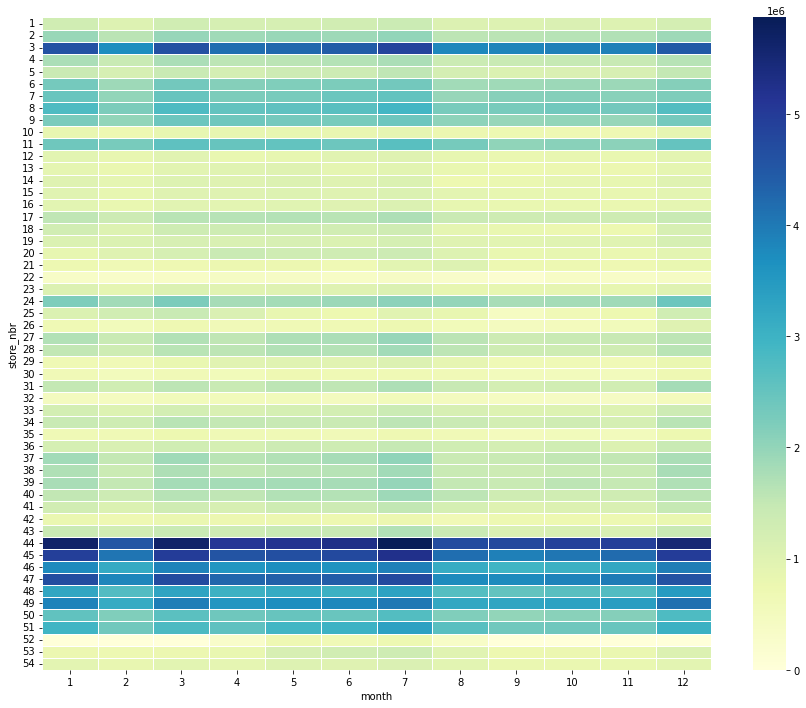

In [11]:
# check the sales across the months to understand the pattern. In this case we clearly 
# don't see gradual increase of sales for any stores over time. more or less all stores 
# are doing same business  from previous months

table = pd.pivot_table(train_df, values ='sales', index =['store_nbr'],
                         columns =['month'], aggfunc = np.sum)
fig, ax = plt.subplots(figsize=(15,12))         
sns.heatmap(table, annot=False, linewidths=.5, ax=ax, cmap="YlGnBu")
plt.show()

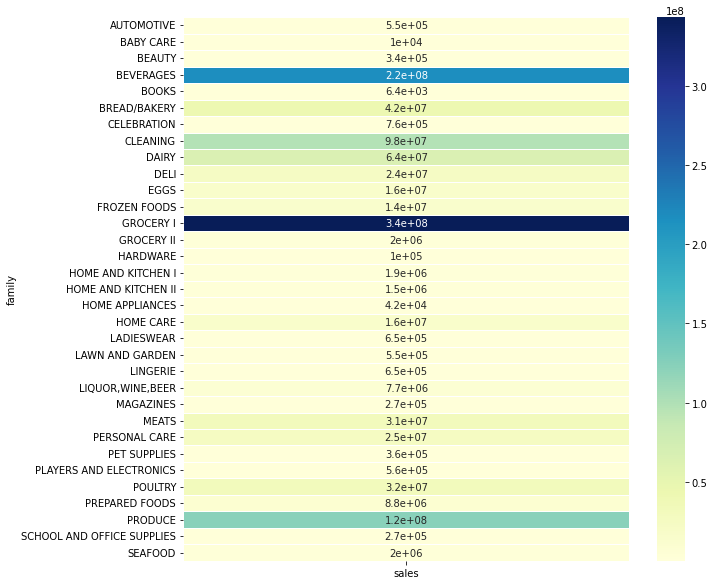

In [12]:
# check how the different family is impacting the sales, clearly here we have a pattern here, we will use 
# this information later for feature engineering. 

table1 = pd.pivot_table(train_df, values ='sales', index =['family'], aggfunc = np.sum)
fig, ax = plt.subplots(figsize=(10,10))         
sns.heatmap(table1, annot=True, linewidths=.5, ax=ax, cmap="YlGnBu")
plt.show()

In [13]:
# percentage of sales contributed by each family 

total_sum = table1.sales.sum()
table1/total_sum

,sales
family,
AUTOMOTIVE,0.00
BABY CARE,0.00
BEAUTY,0.00
BEVERAGES,0.20
BOOKS,0.00
BREAD/BAKERY,0.04
CELEBRATION,0.00
CLEANING,0.09
DAIRY,0.06


In [14]:
# taking two stores [1 and 2] for checking the impact of promotion on sales.
# clearly there is a week bound between sales and promotion. 
import plotly.express as px
fig = px.scatter(train_df[train_df.store_nbr==1], x="onpromotion", y="sales")
fig.show()


In [15]:
import plotly.express as px
fig = px.scatter(train_df[train_df.store_nbr==2], x="onpromotion", y="sales")
fig.show()


In [16]:
# total sales with and without promotion, because of huge data 
# withoug promotion, this graph isn't helping for analysis
import plotly.express as px
df = px.data.tips()
fig = px.histogram(train_df[train_df.onpromotion<200], x="onpromotion", nbins=20)
fig.show()


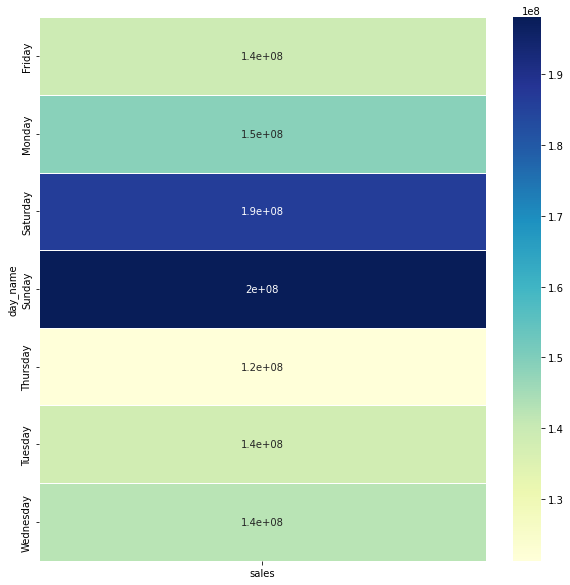

In [17]:
# checking if any day of the week have impact on sales, clearly we can see weekend sales is always high
# will use this information for feature engineering.

table3 = pd.pivot_table(train_df, values ='sales', index =['day_name'], aggfunc = np.sum)
fig, ax = plt.subplots(figsize=(10,10))         
sns.heatmap(table3, annot=True, linewidths=.5, ax=ax, cmap="YlGnBu")
plt.show()

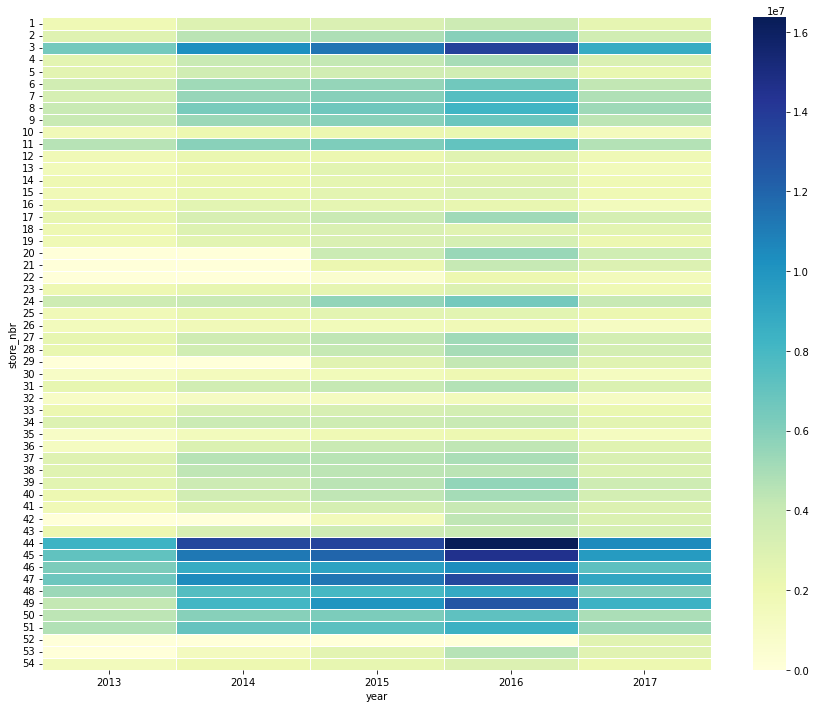

In [18]:
# checking if the sales year have any impact, there is a weak co-relation with year and sales.  
table_year = pd.pivot_table(train_df, values ='sales', index =['store_nbr'],
                         columns =['year'], aggfunc = np.sum)

fig, ax = plt.subplots(figsize=(15,12))         
sns.heatmap(table_year, annot=False, linewidths=.5, ax=ax, cmap="YlGnBu")
plt.show()

# manipulating the training data for model building/ feature engineering

In [19]:
# from analysis it was seen that few members sales was high, depending upon sales proportion 
# making the groups for family

family_map       = {'AUTOMOTIVE': 'rest',
                   'BABY CARE': 'rest',
                   'BEAUTY': 'rest',
                   'BOOKS': 'rest',
                   'CELEBRATION': 'rest',
                   'GROCERY II': 'rest',
                   'HARDWARE': 'rest',
                   'HOME AND KITCHEN I': 'rest',
                   'HOME AND KITCHEN II': 'rest',
                   'HOME APPLIANCES': 'rest',
                   'LADIESWEAR': 'rest',
                   'LAWN AND GARDEN': 'rest',
                   'LINGERIE': 'rest',
                   'MAGAZINES': 'rest',
                   'PET SUPPLIES': 'rest',
                   'PLAYERS AND ELECTRONICS': 'rest',
                   'SCHOOL AND OFFICE SUPPLIES': 'rest',
                   'SEAFOOD': 'rest',
                   'DELI': 'first_sec',
                    'EGGS': 'first_sec',
                    'FROZEN FOODS': 'first_sec',
                    'HOME CARE': 'first_sec',
                    'LIQUOR,WINE,BEER': 'first_sec',
                    'PREPARED FOODS': 'first_sec',
                    'PERSONAL CARE': 'first_sec',
                    'BREAD/BAKERY': 'third',
                    'MEATS': 'third',
                    'POULTRY': 'third',
                    'CLEANING':'fourth',
                    'DAIRY':'fourth',
                    'PRODUCE':'seventh',
                    'BEVERAGES':'fifth',
                    'GROCERY I': 'sixth'
                   }

train_df['new_family'] = train_df['family'].map(family_map)
train_df.head(2)

,id,date,store_nbr,family,sales,onpromotion,month,day,day_name,year,new_family
0,0,2013-01-01,1,AUTOMOTIVE,0.00,0,1,1,Tuesday,2013,rest
1,1,2013-01-01,1,BABY CARE,0.00,0,1,1,Tuesday,2013,rest


In [20]:
# Handling the ouliers.

In [21]:
# graph for before handling the oulier 
import plotly.express as px
fig = px.scatter(train_df[train_df.store_nbr==4], x="date", y="sales")
fig.show()


In [22]:
# handling the ouliers for each store

for i in range(1,len(train_df.store_nbr.unique())+1):
    val = train_df[train_df.store_nbr == i].sales.quantile(0.99)
    train_df = train_df.drop(train_df[(train_df.store_nbr==i) & (train_df.sales > val)].index)

In [23]:
#after handling the ouliers
# after removing the outlier columns we will loose nealry 1% of the total rows for all the stores.
fig = px.scatter(train_df[train_df.store_nbr==4], x="date", y="sales")
fig.show()

# analysis with store metadata and holiday data

In [24]:
store_df.shape

(54, 5)

In [25]:
# merging the store data with training data
train_df = pd.merge(train_df, store_df, on='store_nbr', how='left') 
train_df.head(3)

,id,date,store_nbr,family,sales,onpromotion,month,day,day_name,year,new_family,city,state,type,cluster
0,0,2013-01-01,1,AUTOMOTIVE,0.00,0,1,1,Tuesday,2013,rest,Quito,Pichincha,D,13
1,1,2013-01-01,1,BABY CARE,0.00,0,1,1,Tuesday,2013,rest,Quito,Pichincha,D,13
2,2,2013-01-01,1,BEAUTY,0.00,0,1,1,Tuesday,2013,rest,Quito,Pichincha,D,13


In [26]:
#holiday data
hol_df.head(2)

,date,type,locale,locale_name,description,transferred
0,2012-03-02,Holiday,Local,Manta,Fundacion de Manta,False
1,2012-04-01,Holiday,Regional,Cotopaxi,Provincializacion de Cotopaxi,False


In [27]:
# types of holidays
hol_df.locale.unique()

array(['Local', 'Regional', 'National'], dtype=object)

In [28]:
# unique local names (this info combining with store meta data will help in merging with trining data)
hol_df.locale_name.unique()

array(['Manta', 'Cotopaxi', 'Cuenca', 'Libertad', 'Riobamba', 'Puyo',
       'Guaranda', 'Imbabura', 'Latacunga', 'Machala', 'Santo Domingo',
       'El Carmen', 'Cayambe', 'Esmeraldas', 'Ecuador', 'Ambato',
       'Ibarra', 'Quevedo', 'Santo Domingo de los Tsachilas',
       'Santa Elena', 'Quito', 'Loja', 'Salinas', 'Guayaquil'],
      dtype=object)

In [29]:
# unique city data
store_df.city.unique()

array(['Quito', 'Santo Domingo', 'Cayambe', 'Latacunga', 'Riobamba',
       'Ibarra', 'Guaranda', 'Puyo', 'Ambato', 'Guayaquil', 'Salinas',
       'Daule', 'Babahoyo', 'Quevedo', 'Playas', 'Libertad', 'Cuenca',
       'Loja', 'Machala', 'Esmeraldas', 'Manta', 'El Carmen'],
      dtype=object)

In [30]:
store_df.state.unique()

array(['Pichincha', 'Santo Domingo de los Tsachilas', 'Cotopaxi',
       'Chimborazo', 'Imbabura', 'Bolivar', 'Pastaza', 'Tungurahua',
       'Guayas', 'Santa Elena', 'Los Rios', 'Azuay', 'Loja', 'El Oro',
       'Esmeraldas', 'Manabi'], dtype=object)

In [31]:
hol_df.type.unique()

array(['Holiday', 'Transfer', 'Additional', 'Bridge', 'Work Day', 'Event'],
      dtype=object)

In [32]:
# renaming a column, since tranining data also has a column 'type' helps for clear merge.
hol_df.rename(columns={'type': 'day_nature'},
          inplace=True, errors='raise')


In [33]:
# only 1 national name Ecuador
hol_df[hol_df.locale=='National'].head(3)

,date,day_nature,locale,locale_name,description,transferred
14,2012-08-10,Holiday,National,Ecuador,Primer Grito de Independencia,False
19,2012-10-09,Holiday,National,Ecuador,Independencia de Guayaquil,True
20,2012-10-12,Transfer,National,Ecuador,Traslado Independencia de Guayaquil,False


In [34]:
# creating different data frames with different holidays to merge
holiday_loc = hol_df[hol_df.locale == 'Local']
holiday_reg = hol_df[hol_df.locale == 'Regional']
holiday_nat = hol_df[hol_df.locale == 'National']


In [35]:
holiday_loc.rename(columns={'locale_name': 'city'},
          inplace=True, errors='raise')
holiday_reg.rename(columns={'locale_name': 'state'},
          inplace=True, errors='raise')

/opt/conda/lib/python3.7/site-packages/pandas/core/frame.py:5047: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [36]:
holiday_loc

,date,day_nature,locale,city,description,transferred
0,2012-03-02,Holiday,Local,Manta,Fundacion de Manta,False
2,2012-04-12,Holiday,Local,Cuenca,Fundacion de Cuenca,False
3,2012-04-14,Holiday,Local,Libertad,Cantonizacion de Libertad,False
4,2012-04-21,Holiday,Local,Riobamba,Cantonizacion de Riobamba,False
5,2012-05-12,Holiday,Local,Puyo,Cantonizacion del Puyo,False
...,...,...,...,...,...,...
339,2017-12-05,Additional,Local,Quito,Fundacion de Quito-1,False
340,2017-12-06,Holiday,Local,Quito,Fundacion de Quito,True
341,2017-12-08,Holiday,Local,Loja,Fundacion de Loja,False
342,2017-12-08,Transfer,Local,Quito,Traslado Fundacion de Quito,False


In [37]:
train_df = pd.merge(train_df, holiday_loc, on=['date', 'city'], how='left') 
train_df = train_df[~((train_df.day_nature == 'Holiday') & (train_df.transferred == False))]
train_df.drop(['day_nature', 'locale', 'description','transferred'], axis=1, inplace=True)
train_df = pd.merge(train_df, holiday_reg, on=['date', 'state'], how='left') 
train_df = train_df[~((train_df.day_nature == 'Holiday') & (train_df.transferred == False))]
train_df.drop(['day_nature', 'locale', 'description','transferred'], axis=1, inplace=True)
train_df = pd.merge(train_df, holiday_nat, on=['date'], how='left') 
train_df = train_df[~((train_df.day_nature == 'Holiday') & (train_df.transferred == False))]
train_df.drop(['day_nature', 'locale', 'description','transferred'], axis=1, inplace=True)

In [38]:
train_df.drop(['id', 'date', 'family', 'month', 'day','city','state','type', 'cluster', 'locale_name', 'year'],axis=1, inplace=True)


In [39]:
train_df = pd.get_dummies(train_df, columns = ['day_name','new_family'])
train_df.reset_index(inplace=True)
train_df.drop(['index'],axis=1, inplace=True)
train_df.head(2)

,store_nbr,sales,onpromotion,day_name_Friday,day_name_Monday,day_name_Saturday,day_name_Sunday,day_name_Thursday,day_name_Tuesday,day_name_Wednesday,new_family_fifth,new_family_first_sec,new_family_fourth,new_family_rest,new_family_seventh,new_family_sixth,new_family_third
0,1,2.00,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0
1,1,0.00,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0


In [40]:
from sklearn.linear_model import LinearRegression
from xgboost import XGBRegressor
from sklearn import preprocessing


for i in range(1,len(train_df.store_nbr.unique())+1):  
    temp_df = train_df[train_df.store_nbr == i]
    sale_out = temp_df[['sales']]
    globals()['max_%s' % i] = temp_df['onpromotion'].max()
    temp_df['onpromotion'] = (temp_df['onpromotion']/globals()['max_%s' % i])
    temp_df.onpromotion = np.where(temp_df.onpromotion<0, 0, temp_df.onpromotion)
    temp_df.drop(['sales','store_nbr'],axis=1, inplace=True)
    globals()['model_%s' % i] = XGBRegressor(verbosity=0)
    globals()['model_%s' % i].fit(temp_df, sale_out)


/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:10: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/opt/conda/lib/python3.7/site-packages/pandas/core/generic.py:5516: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/opt/conda/lib/python3.7/site-packages/pandas/core/frame.py:4913: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-ver

In [41]:
test_df['day_name'] = pd.to_datetime(test_df['date']).dt.day_name()
test_df['new_family'] = test_df['family'].map(family_map)
test_df.drop(['date','family'],axis=1, inplace=True)
test_df = pd.get_dummies(test_df, columns = ['day_name','new_family'])
test_df.head(2)

,id,store_nbr,onpromotion,day_name_Friday,day_name_Monday,day_name_Saturday,day_name_Sunday,day_name_Thursday,day_name_Tuesday,day_name_Wednesday,new_family_fifth,new_family_first_sec,new_family_fourth,new_family_rest,new_family_seventh,new_family_sixth,new_family_third
0,3000888,1,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0
1,3000889,1,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0


In [42]:
backup_df_1 = pd.DataFrame()

for i in range(1,len(train_df.store_nbr.unique())+1):
    temp_df = test_df[test_df.store_nbr == i]
    temp_df['onpromotion'] = (temp_df['onpromotion']/globals()['max_%s' % i])
    temp_df.onpromotion = np.where(temp_df.onpromotion<0, 0, temp_df.onpromotion)
    save_id = temp_df[['id']].reset_index()
    temp_df.drop(['id','store_nbr'],axis=1, inplace=True)
    submit = globals()['model_%s' % i].predict(temp_df)
    save_id['sales'] = submit
    df11 = pd.DataFrame(submit, columns = ['sales'])
    backup_df = pd.concat([save_id[['id']], df11], axis = 1, ignore_index = True)
    backup_df_1 = backup_df_1.append(backup_df, ignore_index=True)

backup_df_1.rename(columns={0 : "id", 1 : "sales"}, inplace=True, errors='raise')
test_df = pd.merge(test_df, backup_df_1, on='id', how='left') 

/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:5: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/opt/conda/lib/python3.7/site-packages/pandas/core/generic.py:5516: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/opt/conda/lib/python3.7/site-packages/pandas/core/frame.py:4913: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-vers

In [43]:
backup_df_1.head(4)

,id,sales
0,3000888,8.08
1,3000889,8.08
2,3000890,19.22
3,3000891,2579.22


In [44]:
sample_df = test_df[['id', 'sales']]
sample_df.sales = np.where(sample_df.sales<0, 0, sample_df.sales)
sample_df.head(3)

/opt/conda/lib/python3.7/site-packages/pandas/core/generic.py:5516: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



,id,sales
0,3000888,8.08
1,3000889,8.08
2,3000890,19.22


In [45]:
sample_df.to_csv('submission.csv' , index = False)